In [ ]:
%matplotlib inline

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# @title Intall and load Watermark for displaying versions of imports
%%capture
!pip install watermark

#load
%load_ext watermark

#To view all available commands
%watermark?

## Virtual Display Setup




In [ ]:
# !pip install -r https://raw.githubusercontent.com/huggingface/deep-rl-class/main/notebooks/unit2/requirements-unit2.txt

# This installs all the following:
# gymnasium
!pip installpygame
!pip install numpy

# huggingface_hub
!pip install pickle5
!pip install pyyaml==6.0
!pip install imageio
!pip install imageio_ffmpeg
!pip install pyglet==1.5.1
!pip install tqdm

ERROR: unknown command "installpygame" - maybe you meant "install"
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pickle5: filename=pickle5-0.0.11-cp310-cp310-linux_x86_64.whl size=255316 sha256=47e6f466e5ff1e70d5ea71a4060f815508d030e962e75cc62ac430366975e45a
  Stored in directory: /root/.cache/pip/wheels/7d/14/ef/4aab19d27fa8e58772be5c71c16add0426acf9e1f64353235c
Successfully built pickle5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 682.2/682.2 kB 7.1 MB/s eta 0:00:00
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires openai, which is not in

In [ ]:
# @title For setting up pyvirtualdisplay
# -q means quiet
!sudo apt-get update
!sudo apt-get install -y python3-opengl
!apt install ffmpeg xvfb
!pip3 install pyvirtualdisplay

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [634 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,046 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [109 kB]
Get:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease [24.3 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,305 kB]
Hit:

In [ ]:
# @title Virtual display
from pyvirtualdisplay import Display

virtual_display = Display(visible=0, size=(1400, 900))
virtual_display.start()

In [ ]:
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay
import imageio

## Virtual Display setup ends here

In [ ]:
!pip install -q gymnasium

# You need swig before installing box2d
!pip install -q swig
!pip install -q gymnasium[box2d]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from __future__ import annotations

import os
import sys
import time
from datetime import datetime, date
import copy

import cv2

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from tqdm import tqdm

import gymnasium as gym

from torch.distributions import Beta
from torch.utils.data.sampler import BatchSampler, SubsetRandomSampler


## Use utf instead of ansi encoding

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
print(locale.getpreferredencoding())

UTF-8


In [ ]:
# @title These are the versions used in this notebook
%watermark -a "Yusupha Juwara" -i -u -v -w -iv -p tqdm
# %watermark -p sklearn

Author: Yusupha Juwara

Last updated: 2023-12-14T22:43:35.822249+00:00

Python implementation: CPython
Python version       : 3.10.12
IPython version      : 7.34.0

tqdm: 4.66.1

numpy     : 1.23.5
IPython   : 7.34.0
cv2       : 4.8.0
sys       : 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
matplotlib: 3.7.1
imageio   : 2.31.6
gymnasium : 0.29.1
torch     : 2.1.0+cu121

Watermark: 2.4.3



In [ ]:
# @title set the device
seed = 40
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
torch.manual_seed(seed)
if use_cuda:
    torch.cuda.manual_seed(seed)

device

device(type='cuda')

In [ ]:
# @title (Hyper)Parameters
gamma, action_repeat, img_stack = 0.99, 4, 4
lambd, c1, entropy_coef = 0.95, 1, 1e-2

max_grad_norm = 0.5
clip_rate = 0.1  # epsilon in clipped loss
ppo_epoch = 10

# Note that the max episode len is 1000; so, update earlier
buffer_capacity, batch_size = 100, 20
# buffer_capacity = int(1e5)

clip_weights = 40
initial_no_op = 50 # skip the first 50 frames

policy_lr = 3e-4 # slow to let critic digest ...
value_lr = 1e-3
scale = False
eval_loop = 3
train_loop = int(1e6)

transition = np.dtype([
                        ('s', np.float32, (img_stack, 96, 96)),
                        ('s_', np.float32, (img_stack, 96, 96)),
                        ('a', np.float32, (3,)),
                        ('a_logp', np.float32, (3,)),
                        ('r', np.float32),
                        ('term_or_trunc', np.bool_),
                        ('term', np.bool_)
                    ])

In [ ]:
# folder_path = '/content/drive/MyDrive/AI_Robotics/y1-s1-reinforcement-learning/hms/3'
# sys.path.append(folder_path)
# sys.path.append(git_clone_path)
# git_model_name = '/content/drive/MyDrive/AI_Robotics/y1-s1-reinforcement-learning/hms/3/pytorch_car_caring/param/ppo_net_params.pkl'
# model_name = '/content/drive/MyDrive/AI_Robotics/y1-s1-reinforcement-learning/hms/3/model_weights_v1.pkl'

folder_path = 'hm3'
if not os.path.isdir(folder_path):
    os.mkdir(folder_path)

sys.path.append(folder_path)

model_name = os.path.join(folder_path, 'model_weights_v1.pkl')




In [ ]:
# @title Environment
env = gym.make('CarRacing-v2', continuous=True)
print("Observation space: ", env.observation_space)
print("Action space: ", env.action_space)

max_action = float(env.action_space.high[0])
print("Max action", max_action)

print(f"\n\nEnv Spec: {env.spec}")

Observation space:  Box(0, 255, (96, 96, 3), uint8)
Action space:  Box([-1.  0.  0.], 1.0, (3,), float32)
Max action 1.0


Env Spec: EnvSpec(id='CarRacing-v2', entry_point='gymnasium.envs.box2d.car_racing:CarRacing', reward_threshold=900, nondeterministic=False, max_episode_steps=1000, order_enforce=True, autoreset=False, disable_env_checker=False, apply_api_compatibility=False, kwargs={'continuous': True}, namespace=None, name='CarRacing', version=2, additional_wrappers=(), vector_entry_point=None)


In [ ]:
# @title Env class
class Env(gym.Wrapper):
    """
    Environment wrapper for CarRacing
    """
    def __init__(self):
        self.env = gym.make('CarRacing-v2', render_mode="rgb_array")
        self.env.reset(seed=seed)
        self.initial_no_op = initial_no_op

    def reset(self):

        # Reset the original environment.
        s, info = self.env.reset()

        # Do random sample for the next `self.initial_no_op` steps
        for i in range(self.initial_no_op):
            action = self.env.action_space.sample()
            s, r, terminated, truncated, info = self.env.step(action)

        s = self.rgb2gray(s)

        # The initial observation is simply a copy of the frame `s`
        self.stack = [s] * img_stack
        return np.array(self.stack), info

    def step(self, action):
        total_reward = 0
        for i in range(action_repeat):
            img_rgb, reward, terminated, truncated, info = self.env.step(action)

            total_reward += reward

            if terminated or truncated:
                break
        img_gray = self.rgb2gray(img_rgb)

        # Push the current frame `s` at the end of self.stack
        self.stack = np.concatenate((self.stack[1:], img_gray[np.newaxis]), axis=0)

        return np.array(self.stack), total_reward, terminated, truncated, info

    def render(self, *arg):
        return self.env.render(*arg)

    @staticmethod
    def rgb2gray(img, scale=scale):
        if scale:
            img = img[:84, 6:90] # CarRacing-v2-specific cropping

        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) / 255.0
        return gray

In [ ]:
# @title Replay Buffer
class ReplayBuffer:
    '''Replay buffer for holding transitions'''
    def __init__(self, buffer_capacity=buffer_capacity):

        self.buffer_capacity = max(buffer_capacity, 1) # at least 1 elem
        self.clear_buffer()

    def clear_buffer(self):
        self.counter = 0
        self.buffer = np.empty(self.buffer_capacity, dtype=transition)

    def store(self, transition):
        '''Store transitions'''
        s, s_, a, a_logp, r, term_or_trunc, term = transition

        # s: (4, 84, 84) a: (3,) a_logp: (3,) r: -0.3999999999999986 term_trunc: False
        # print(f"Shapes:\n \n\ts: {s.shape} \n\ta: {a.shape} \n\ta_logp: {a_logp.shape} \n\tr: {r} \n\tterm_trunc: {term_or_trunc}")

        self.buffer['s'][self.counter] = s
        self.buffer['s_'][self.counter] = s_
        self.buffer['a'][self.counter] = a
        self.buffer['a_logp'][self.counter] = a_logp
        self.buffer['r'][self.counter] = r
        self.buffer['term_or_trunc'][self.counter] = term_or_trunc
        self.buffer['term'][self.counter] = term

        #self.buffer[self.counter] = transition
        self.counter += 1
        is_full = (self.buffer_capacity - self.counter) == 0

        self.counter %= self.buffer_capacity
        return is_full

    def get_transitions(self):
        '''Get all the transitions of size buffer_capacity'''
        return self.buffer

    def sample_transitions(self, batch_size):
        indices = BatchSampler(SubsetRandomSampler(range(self.buffer_capacity)), batch_size, False)
        return indices

In [ ]:
# @title Base cnn feature extraction layers
class ConvNoScale(nn.Sequential):
    def __init__(self):
        super(ConvNoScale, self).__init__(
            nn.Conv2d(img_stack, 8, kernel_size=4, stride=2, padding=0, bias=False), # input shape (4, 96, 96)
            # nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),

            nn.Conv2d(8, 16, kernel_size=3, stride=2, padding=0, bias=False), # (8, 47, 47)
            # nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),

            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=0, bias=False), # (16, 23, 23)
            # nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=0, bias=False), # (32, 11, 11)
            # nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=0, bias=False), # (64, 5, 5)
            # nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=0, bias=False), # (128, 3, 3)
            # nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
        )

class ConvScale(nn.Sequential):
    def __init__(self):

        super(ConvNoScale, self).__init__(
            nn.Conv2d(img_stack, 16, kernel_size=3, stride=2, padding=0, bias=False), # input shape (4, 84, 84) to (16, 41, 41)
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),

            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=0, bias=False), # (16, 41, 41) to (32, 20, 20)
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=0, bias=False), # (32, 20, 20) to (64, 9, 9)
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=0, bias=False), # (64, 9, 9) to (128, 4, 4)
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=0, bias=False), # (128, 4, 4) to (256, 1, 1)
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
        )

In [ ]:
# @title Network

class Net(nn.Module):
    """
    Actor-Critic Network for PPO
    """

    def __init__(self, scale=scale):
        super(Net, self).__init__()

        self.init_fc_feat = 256
        self.cnn_base = ConvScale() if scale else ConvNoScale()

        self.v = nn.Sequential(nn.Linear(self.init_fc_feat, 100), nn.ReLU(), nn.Linear(100, 1))
        self.fc = nn.Sequential(nn.Linear(self.init_fc_feat, 100), nn.ReLU())
        self.alpha_head = nn.Sequential(nn.Linear(100, 3), nn.ReLU())
        self.beta_head = nn.Sequential(nn.Linear(100, 3), nn.ReLU()) #nn.Softplus())

        if scale and os.path.exists(model_name):
            self.load_weights()
        else:
            # self.apply(self._weights_init)
            self._weights_init()

    # #@staticmethod
    # def _weights_init(m):
    #     if isinstance(m, nn.Conv2d):
    #         nn.init.xavier_uniform_(m.weight, gain=nn.init.calculate_gain('relu'))
    #         nn.init.constant_(m.bias, 0.1)


    def _weights_init(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.001)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        #print(f"S shape: {x.shape}")
        x = self.cnn_base(x)
        x = x.view(-1, self.init_fc_feat)
        v = self.v(x)
        x = self.fc(x)
        alpha = self.alpha_head(x) + 1
        beta = self.beta_head(x) + 1

        return (alpha, beta), v

    def get_dist(self, state):
        alpha, beta = self.forward(state)[0]
        dist = Beta(alpha, beta)
        return dist

    def deterministic_act(self, state):
        alpha, beta = self.forward(state)[0]
        mode = (alpha) / (alpha + beta)
        return mode

    def load_weights(self, model_path=model_name):
        self.load_state_dict(torch.load(model_path, map_location=device))


In [ ]:
# @title Training

class Agent():
    """
    Agent for training
    """
    max_grad_norm = max_grad_norm
    clip_rate = clip_rate  # epsilon in clipped loss
    ppo_epoch = ppo_epoch
    buffer_capacity, batch_size = buffer_capacity, batch_size

    def __init__(self):

        self.buffer = ReplayBuffer(buffer_capacity)

        self.net = Net().float().to(device)

        # Better to update the actor and critic's weights differently for network stability; recommended by Sergey Levine of UC Berkeley.
        policy_weights = list(self.net.cnn_base.parameters()) + \
                        list(self.net.fc.parameters()) + \
                        list(self.net.alpha_head.parameters()) + \
                        list(self.net.beta_head.parameters())
        self.policy_optimizer = optim.Adam(policy_weights, lr=policy_lr)

        value_weights = list(self.net.cnn_base.parameters()) + \
                        list(self.net.v.parameters())
        self.value_optimizer = optim.Adam(value_weights, lr=value_lr)

    @torch.no_grad()
    def select_action(self, state, deterministic=False):
        state = torch.from_numpy(state).float().to(device).unsqueeze(0)
        if deterministic:
            # only used when evaluate the policy.Making the performance more stable
            action = self.net.deterministic_act(state)

            action = action.squeeze().cpu().numpy()
            return action, None  # action is in shape (adim, 0)
        else:
            # only used when interact with the env
            dist = self.net.get_dist(state)
            action = dist.sample()
            action = torch.clamp(action, 0, 1)
            logprob_a = dist.log_prob(action).cpu().numpy().flatten()

            action = action.squeeze().cpu().numpy()
            # action = self.action_adapter(action, max_action)
            return action, logprob_a # both are in shape (adim, 0)

    def action_adapter(self, action, max_action):
        #from [0,1] to [-max,max]
        return  2*(action - 0.5)*max_action

    def save_param(self, model_path=model_name):
        torch.save(self.net.state_dict(), model_path)

    def store(self, transition):
        return self.buffer.store(transition)

    def update(self):

        buffer = self.buffer.get_transitions()
        s = torch.tensor(buffer['s'].copy(), dtype=torch.float).to(device)
        a = torch.tensor(buffer['a'].copy(), dtype=torch.float).to(device)
        r = torch.tensor(buffer['r'].copy(), dtype=torch.float).to(device).view(-1, 1)
        s_ = torch.tensor(buffer['s_'].copy(), dtype=torch.float).to(device)
        old_a_logp = torch.tensor(buffer['a_logp'].copy(), dtype=torch.float).to(device).view(-1, 1)
        term_or_trunc = torch.tensor(buffer['term_or_trunc'].copy(), dtype=torch.bool).to(device)
        term = torch.tensor(buffer['term'].copy(), dtype=torch.bool).to(device)

        adv, td_target = self.advantage((s, s_, a, old_a_logp, r, term_or_trunc, term))

        for _ in range(self.ppo_epoch):
            # for index in BatchSampler(SubsetRandomSampler(range(self.buffer_capacity)), self.batch_size, False):
            for index in self.buffer.sample_transitions(self.batch_size):

                distribution = self.net.get_dist(s[index])
                dist_entropy = distribution.entropy().sum(1, keepdim=True)
                logprob_a_now = distribution.log_prob(a[index])
                ratio = torch.exp(logprob_a_now.sum(1, keepdim=True) - old_a_logp[index].sum(1, keepdim=True))  # a/b == exp(log(a)-log(b))

                 # Note that when the actor and critic shares the same network, the entropy encourages exploration
                 # Some use the kl divergence instead ...
                entropy_term = (entropy_coef * dist_entropy)

                adv_index = adv[index]
                surr1 = ratio * adv_index
                surr2 = torch.clamp(ratio, 1 - self.clip_rate, 1 + self.clip_rate) * adv_index
                policy_loss = torch.min(surr1, surr2)
                policy_loss = -(policy_loss + entropy_term).mean() # gradient ascent, not descent

                self.policy_optimizer.zero_grad()
                policy_loss.backward()
                self.policy_optimizer.step()

                value_loss = (self.net(s[index])[1] - td_target[index]).pow(2)
                value_loss = (c1*value_loss).mean() # gradient ascent, not descent

                self.value_optimizer.zero_grad()
                value_loss.backward()
                self.value_optimizer.step()

                # clip the net parameters to avoid gradient explosion; leading to NaN values
                nn.utils.clip_grad_norm_(self.net.parameters(), clip_weights)

    @torch.no_grad()
    def advantage(self, transitions):
        '''Use TD+GAE+LongTrajectory to compute Advantage and TD target'''

        s, s_, a, old_a_logp, r, term_or_trunc, term = transitions

        v_ = self.net(s_)[1]
        v  = self.net(s)[1]

        '''term for TD_target and Adv'''
        deltas = r + gamma * v_ * (~term) - v # ~term = 1-term
        deltas = deltas.cpu().flatten().numpy()
        adv = [0]

        '''term_trunc for GAE'''
        for dlt, mask in zip(deltas[::-1], term_or_trunc.cpu().flatten().numpy()[::-1]):
            advantage = dlt + gamma * lambd * adv[-1] * (~mask)
            adv.append(advantage)
        adv.reverse()
        adv = copy.deepcopy(adv[0:-1])
        adv = torch.tensor(adv).unsqueeze(1).float().to(device)
        td_target = adv + v
        adv = (adv - adv.mean()) / ((adv.std()+1e-4))  #sometimes helps

        return adv, td_target

    @torch.no_grad()
    def evaluate(self, max_action, turns=eval_loop, record_frames=False):
        # print("---------------------------Eval starts")
        env_eval = Env()

        frames = []

        total_scores = 0.0
        for j in range(turns):
            s, info = env_eval.reset()

            if record_frames:
                screen = env_eval.render()
                frames.append(screen)

            done = False

            while not done:
                a, logprob_a = self.select_action(s, deterministic=True) # Take deterministic actions when evaluation
                act = self.action_adapter(a, max_action)
                s_next, r, dw, tr, info = env_eval.step(act)

                if record_frames:
                    screen = env_eval.render()
                    frames.append(screen)

                done = (dw or tr)

                total_scores += r
                s = s_next
        # print("Eval ends--------------------------------------")
        return total_scores/turns, frames

    def train(self, plot_fig=True):
        from IPython.display import clear_output

        #agent = Agent()
        env = Env()

        c = 0
        start_time = datetime.utcnow()

        for i_ep in tqdm(range(train_loop)):
            state, info = env.reset()

            done = False

            while not done:
                action, a_logp = self.select_action(state, deterministic=False) # use stochastic when training
                act = self.action_adapter(action, max_action)

                # state_, reward, terminated, truncated, info = env.step(action * np.array([2., 1., 1.]) + np.array([-1., 0., 0.]))
                state_, reward, terminated, truncated, info = env.step(act)
                done = terminated or truncated
                # if args.render:
                #     env.render()

                if done or self.store((state, state_, action, a_logp, reward, done, terminated)):
                    print('\n updating')
                    self.update()
                    self.save_param()

                    ret, _ = self.evaluate(max_action, turns=3, record_frames=False)
                    training_records.append(ret)

                    if plot_fig:
                        steps = list(range(len(training_records)))
                        clear_output()
                        plt.figure(figsize=(8, 5))
                        plt.plot(steps, training_records, 'r-')
                        plt.xlabel('Step', fontsize=16)
                        plt.ylabel('AvgReturn', fontsize=16)
                        plt.xticks(fontsize=14)
                        plt.yticks(fontsize=14)
                        plt.grid(axis='y')
                        plt.show()

                    c += 1
                    end_time = datetime.utcnow()
                    elapsed_time = (end_time - start_time).total_seconds()
                    print(f"\nElapsed Time (sec): {elapsed_time} for {batch_size * c} iterations and {i_ep+1} episodes")

                    if done:
                        self.buffer.clear_buffer()
                        print(f"\n-----------------Episode terminated or truncated-----------\n")

        return training_records

if __name__ == "__main__":
    agent = Agent()
    training_records = []
    agent.train()

In [ ]:
# @title Evaluate the agent
agent = Agent()
ret, frames = agent.evaluate(max_action, turns=eval_loop, record_frames=True)

In [ ]:

l = len(training_records)
x = list(range(l))

plt.figure(figsize=(8, 5))
plt.plot(x, training_records, 'r-')
plt.xlabel('Step', fontsize=16)
plt.ylabel('AvgReturn', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y')
plt.show()

In [ ]:
# @title save the frames for visualization

out_directory = "video/car_racing_v1.gif"

if not os.path.isdir("video"):
    os.mkdir("video")

imageio.mimsave(out_directory, [np.array(img) for i, img in enumerate(frames)], fps=50)

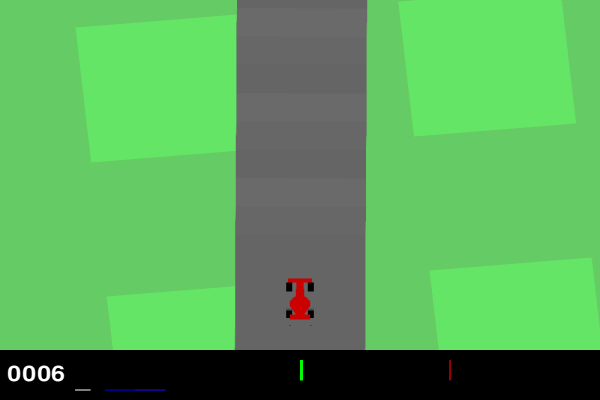

In [ ]:
# @title Visualize video: mode 1
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display

gifPath = f'/content/{out_directory}'
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

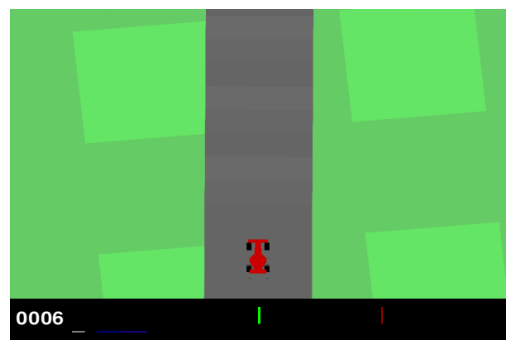

In [ ]:
# @title Visualize video: mode 2
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

# Create animation
# fig = plt.figure(figsize=(10, 10))
fig, ax = plt.subplots()
plt.axis('off')
im = plt.imshow(frames[0])
def animate(i):
    im.set_array(frames[i])
    return im,
anim = matplotlib.animation.FuncAnimation(fig, animate, frames=len(frames))
HTML(anim.to_jshtml())